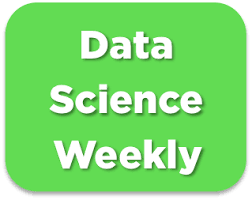

# Challenge : predict conversions 🏆🏆
In this project, you will participate to a machine learning competition like the ones that are organized by https://www.kaggle.com/. You will be able to work with jupyter notebooks as usual, but in the end you'll have to submit your model's predictions to your teacher/TA, so your model's performances will be evaluated in an independent way. The scores achieved by the different teams will be stored into a leaderboard 🏅🏅

## Description of a machine learning challenge 🚴🚴
- In machine learning challenges, the dataset is always separated into to files :
    - *data_train.csv* contains **labelled data**, which means there are both X (explanatory variables) and Y (the target to be predicted). You will use this file to train your model as usual : make the train/test split, preprocessings, assess performances, try different models, fine-tune hyperparameters etc...
    - *data_test.csv* contains "new" examples that have not be used to train the model, in the same format as in *data_train.csv* but it is **unlabeled**, which means the target Y has been removed from the file. Once you've trained a model, you will use *data_test.csv* to make some predictions that you will send to the organizing team. They will then be able to assess the performances of your model in an independent way, by preventing cheating 🤸
- Your model's predictions will be compared to the true labels and releases a leaderboard where the scores of all the teams around the world are stored
- All the participants are informed about the metric that will be used to assess the scores. You have to make sure you're using the same metric to evaluate your train/test performances !

## Company's Description 📇
www.datascienceweekly.org is a famous newsletter curated by independent data scientists. Anyone can register his/her e-mail address on this website to receive weekly news about data science and its applications !

## Project 🚧
The data scientists who created the newsletter would like to understand better the behaviour of the users visiting their website. They would like to know if it's possible to build a model that predicts if a given user will subscribe to the newsletter, by using just a few information about the user. They would like to analyze the parameters of the model to highlight features that are important to explain the behaviour of the users, and maybe discover a new lever for action to improve the newsletter's conversion rate.

They designed a competition aiming at building a model that allows to predict the *conversions* (i.e. when a user will subscribe to the newsletter). To do so, they open-sourced a dataset containing some data about the traffic on their website. To assess the rankings of the different competing teams, they decided to use the **f1-score**.

## Goals 🎯
The project can be cut into four steps :
- Part 1 : make an EDA and the preprocessings and train a baseline model with the file *data_train.csv*
- Part 2 : improve your model's f1-score on your test set (you can try feature engineering, feature selection, regularization, non-linear models, hyperparameter optimization by grid search, etc...)
- Part 3 : Once you're satisfied with your model's score, you can use it to make some predictions with the file *data_test.csv*. You will have to dump the predictions into a .csv file that will be sent to Kaggle (actually, to your teacher/TA 🤓). You can make as many submissions as you want, feel free to try different models !
- Part 4 : Take some time to analyze your best model's parameters. Are there any lever for action that would help to improve the newsletter's conversion rate ? What recommendations would you make to the team ?

# PART 1 - EDA & Preprocessing

## 1.1 Import libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    ConfusionMatrixDisplay,
    RocCurveDisplay,
    classification_report
)


## 1.2 Read file with labels

In [2]:
data = pd.read_csv("conversion_data_train.csv")
print("Set with labels (train + test): ", data.shape)

Set with labels (train + test):  (284580, 6)


In [3]:
data.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


## 1.3. Explore dataset

In [4]:
data.describe(include="all")

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [5]:
print("Percentage of missing values: ")
display(100 * data.isnull().sum() / data.shape[0])

Percentage of missing values: 


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284580 entries, 0 to 284579
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              284580 non-null  object
 1   age                  284580 non-null  int64 
 2   new_user             284580 non-null  int64 
 3   source               284580 non-null  object
 4   total_pages_visited  284580 non-null  int64 
 5   converted            284580 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 13.0+ MB


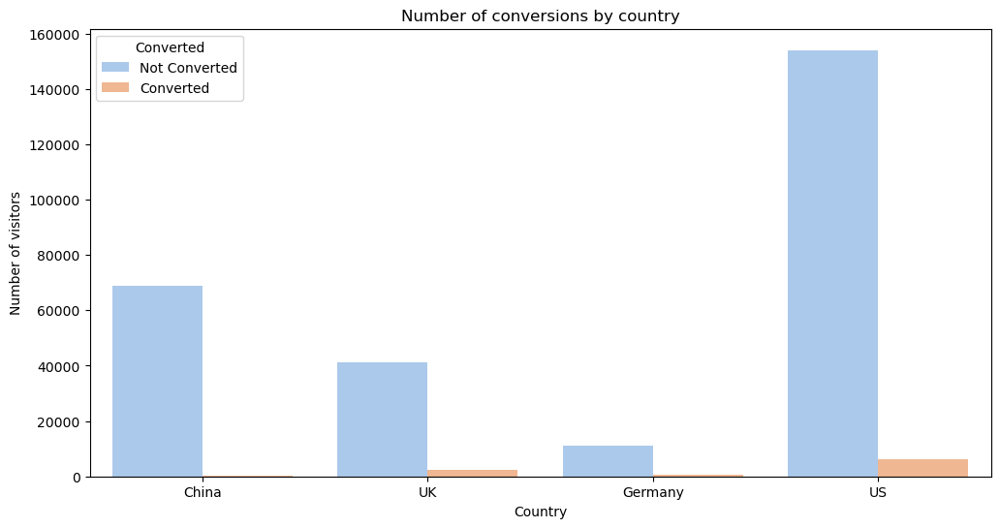

In [79]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x="country", hue="converted", palette="pastel")
plt.xlabel("Country")
plt.ylabel("Number of visitors")
plt.title("Number of conversions by country")
plt.legend(title="Converted", labels=["Not Converted", "Converted"])
plt.show()

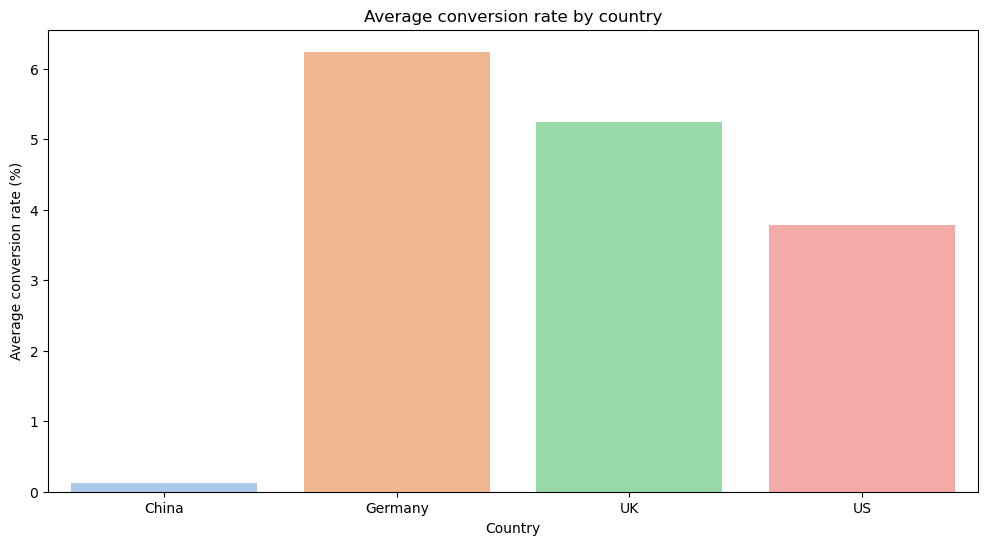

In [83]:
df_grouped_by_country = data.groupby("country")["converted"].mean().reset_index()
df_grouped_by_country["converted"] *= 100
plt.figure(figsize=(12, 6))
sns.barplot(data=df_grouped_by_country, x="country", y="converted", palette="pastel", hue="country", legend="auto")

plt.xlabel("Country")
plt.ylabel("Average conversion rate (%)")
plt.title("Average conversion rate by country")
plt.show()

In [81]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

num_features = ['age', 'total_pages_visited']

fig = make_subplots(rows=1, cols=len(num_features))

for i, feature in enumerate(num_features):
    fig.add_trace(go.Box(y=data[feature], name=feature), row=1, col=i+1)

fig.update_layout(boxmode='group') 
fig.show()

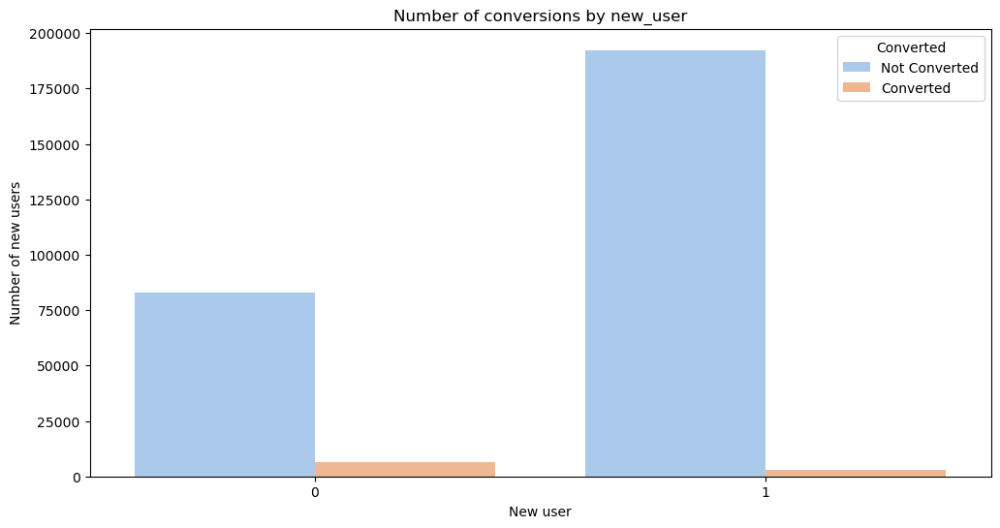

In [82]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x="new_user", hue="converted", palette="pastel")
plt.xlabel("New user")
plt.ylabel("Number of new users")
plt.title("Number of conversions by new_user")
plt.legend(title="Converted", labels=["Not Converted", "Converted"])
plt.show()

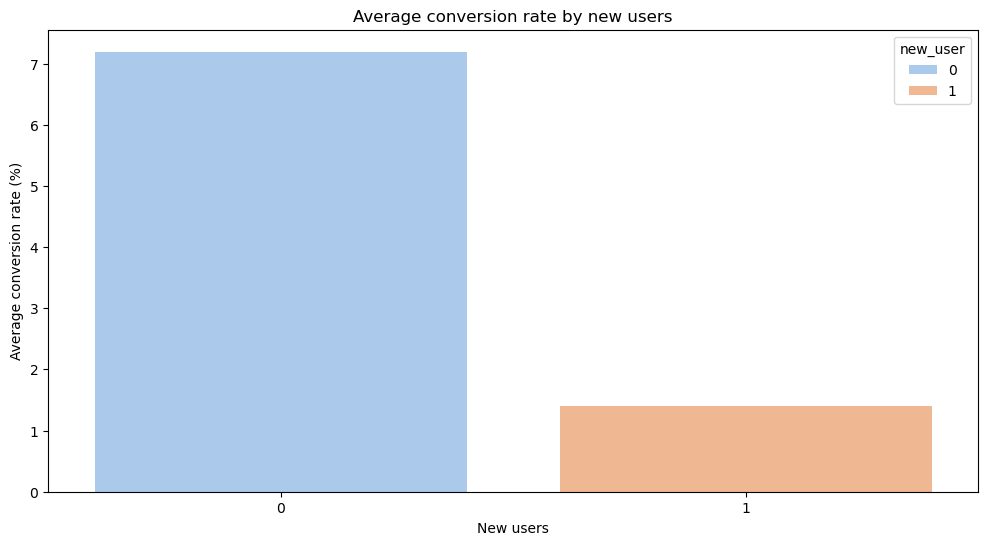

In [96]:
df_grouped_by_new_users = data.groupby("new_user")["converted"].mean().reset_index()
df_grouped_by_new_users["converted"] *= 100
plt.figure(figsize=(12, 6))
sns.barplot(data=df_grouped_by_new_users, x="new_user", y="converted", palette="pastel", hue="new_user", legend="auto")

plt.xlabel("New users")
plt.ylabel("Average conversion rate (%)")
plt.title("Average conversion rate by new users")
plt.show()

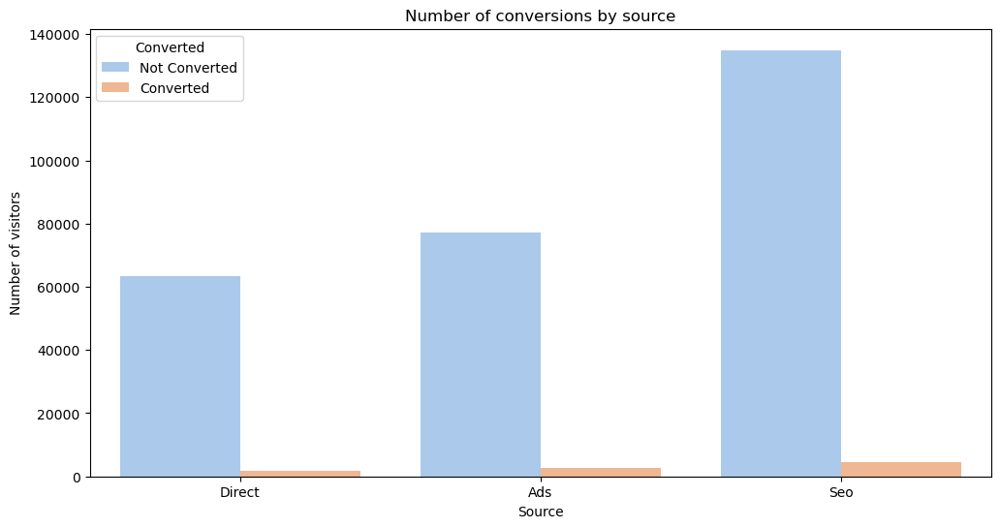

In [88]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x="source", hue="converted", palette="pastel")
plt.xlabel("Source")
plt.ylabel("Number of visitors")
plt.title("Number of conversions by source")
plt.legend(title="Converted", labels=["Not Converted", "Converted"])
plt.show()

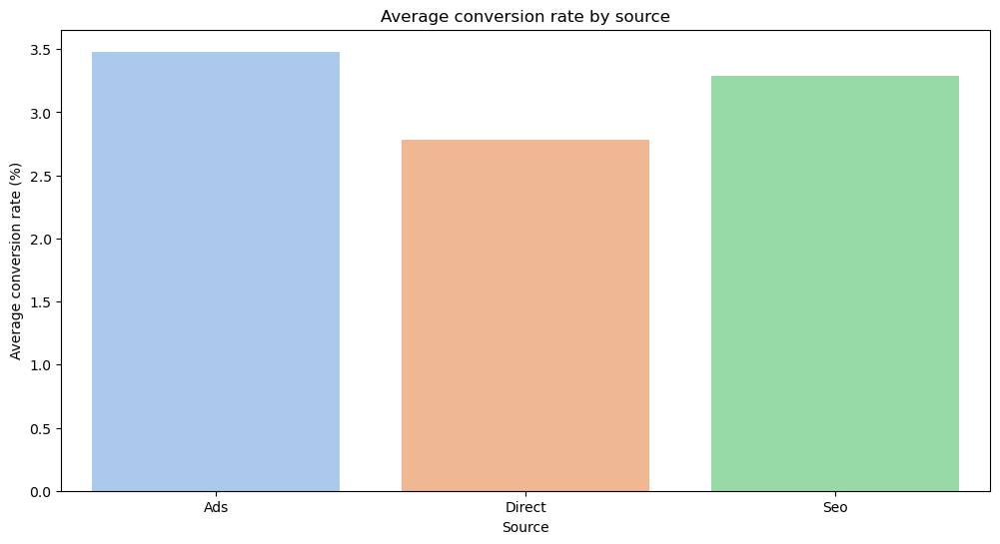

In [90]:
df_grouped_by_source = data.groupby("source")["converted"].mean().reset_index()
df_grouped_by_source["converted"] *= 100
plt.figure(figsize=(12, 6))
sns.barplot(data=df_grouped_by_source, x="source", y="converted", palette="pastel", hue="source", legend="auto")

plt.xlabel("Source")
plt.ylabel("Average conversion rate (%)")
plt.title("Average conversion rate by source")
plt.show()

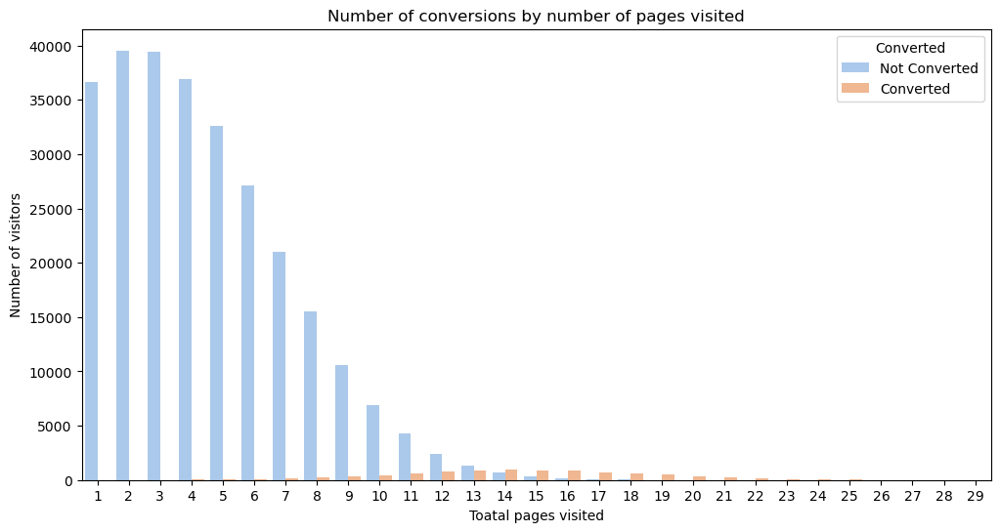

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x="total_pages_visited", hue="converted", palette="pastel")
plt.xlabel("Total pages visited")
plt.ylabel("Number of visitors")
plt.title("Number of conversions by number of pages visited")
plt.legend(title="Converted", labels=["Not Converted", "Converted"])
plt.show()

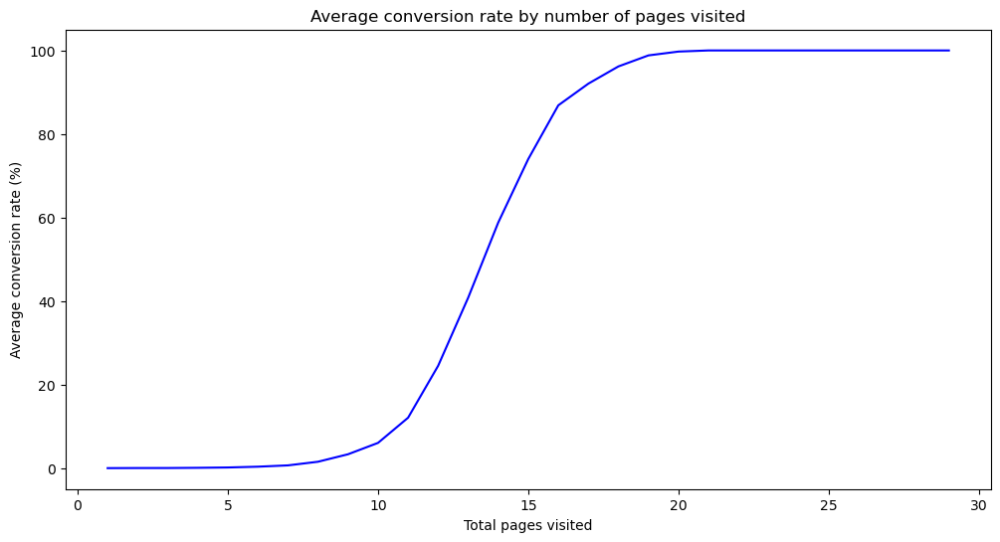

In [95]:
df_grouped_by_pages_visisted = data.groupby("total_pages_visited")["converted"].mean().reset_index()
df_grouped_by_pages_visisted["converted"] *= 100
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_grouped_by_pages_visisted, x="total_pages_visited", y="converted", color="blue")

plt.xlabel("Total pages visited")
plt.ylabel("Average conversion rate (%)")
plt.title("Average conversion rate by number of pages visited")
plt.show()

### We can observe :
 - for **country** : 4 values.( China, Uk, Germany, US) China has the less converted users, while US has the most converted users.The country with the most average converted users is Germany.
 - for **age** : min 17 & max 123 (outlier ?).
 - for **new_user** : 68.5% new users, therefore 31.5% old users.
 - for **source** : 3 values.(Direct, Ads, Seo)
 - for **total_pages_visited** : min 1 & max 29. It seems that between 0 and 7 pages visited, the conversion rate remains close to 0%. It seems that after 18 pages and more, the conversion rate is close to 100% 
 - for **converted** : 3% converted users, therefore 97% not converted users, seems to be consistent. We will have to manage an unbalanced dataset, in fact the number of converts is very low 3%.
 - no missing values.
 - from data.info() we have 4 columns of numeric type, but **new_user** and **converted** are actually boolean columns.


## 1.4. Preprocessing

### We will consider values ​​greater than 80 as outliers for the age column and delete them.

In [8]:
data_cleaned = data[data['age'] <= 80]

In [9]:
num_features = ['age']
fig = make_subplots(rows=1, cols=len(num_features))

for i, feature in enumerate(num_features):
    fig.add_trace(go.Box(y=data_cleaned[feature], name=feature), row=1, col=i+1)

fig.update_layout(boxmode='group') 
fig.show()

## 1.5. Baseline model (logistic regression)

In [10]:
# Separate target variable Y from features X
print("Separating labels from features...")
target_variable = "converted"

X = data.drop(target_variable, axis = 1)
Y = data.loc[:,target_variable]

print("...Done.")
print()

print('Y : ')
print(Y.head())
print()
print('X :')
print(X.head())

Separating labels from features...
...Done.

Y : 
0    0
1    0
2    1
3    0
4    0
Name: converted, dtype: int64

X :
   country  age  new_user  source  total_pages_visited
0    China   22         1  Direct                    2
1       UK   21         1     Ads                    3
2  Germany   20         0     Seo                   14
3       US   23         1     Seo                    3
4       US   28         1  Direct                    3


In [11]:
# Automatically detect names of numeric/categorical columns
numeric_features = X.select_dtypes(include=['float', 'int']).columns.tolist()
categorical_features = X.select_dtypes(exclude=['float', 'int']).columns.tolist()

print('Found numeric features:', numeric_features)
print('Found categorical features:', categorical_features)

Found numeric features: ['age', 'new_user', 'total_pages_visited']
Found categorical features: ['country', 'source']


In [12]:
# Divide dataset Train set & Test set
print("Dividing into train and test sets...")
# WARNING : don't forget stratify=Y for classification problems
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, stratify=Y)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



In [13]:
# Create pipeline for numeric features
# no missing values
numeric_transformer = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
    ]
)

In [14]:
# Create pipeline for categorical features
categorical_transformer = Pipeline(
    steps=[
    ('encoder', OneHotEncoder(drop='first')) # first column will be dropped to avoid creating correlations between features
    ])

In [15]:
# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

In [16]:
# Preprocessings on train set
print("Performing preprocessings on train set...")
print(X_train.head())
X_train = preprocessor.fit_transform(X_train)
print("...Done.")
print(
    X_train[0:5]
)  # MUST use this syntax because X_train is a numpy array and not a pandas DataFrame anymore
print()
# Label encoding
print("Encoding labels...")
print(Y_train.head())
encoder = LabelEncoder()
Y_train = encoder.fit_transform(Y_train)
print("...Done")
print(Y_train[0:5])

# Preprocessings on test set
print("Performing preprocessings on test set...")
print(X_test.head())
X_test = preprocessor.transform(
    X_test
)  # Don't fit again !! The test set is used for validating decisions
# we made based on the training set, therefore we can only apply transformations that were parametered using the training set.
# Otherwise this creates what is called a leak from the test set which will introduce a bias in all your results.
print("...Done.")
print(
    X_test[0:5, :]
)  # MUST use this syntax because X_test is a numpy array and not a pandas DataFrame anymore
print()
# Label encoding
print("Encoding labels...")
print(Y_test[0:5])
Y_test = encoder.transform(Y_test)
print("...Done")
print(Y_test[0:5])

Performing preprocessings on train set...
       country  age  new_user  source  total_pages_visited
137434   China   19         1     Seo                    1
112323      US   33         1  Direct                    5
143261      US   51         1     Ads                    2
162328   China   17         0     Seo                    1
158039   China   28         1     Seo                    5
...Done.
[[-1.3990984   0.67651656 -1.15935344  0.          0.          0.
   0.          1.        ]
 [ 0.29299544  0.67651656  0.03743241  0.          0.          1.
   1.          0.        ]
 [ 2.46854467  0.67651656 -0.86015697  0.          0.          1.
   0.          0.        ]
 [-1.64082609 -1.47816042 -1.15935344  0.          0.          0.
   0.          1.        ]
 [-0.31132378  0.67651656  0.03743241  0.          0.          0.
   0.          1.        ]]

Encoding labels...
137434    0
112323    0
143261    0
162328    0
158039    0
Name: converted, dtype: int64
...Done
[0 0 0 0 0]

### Training pipeline

In [17]:
# Train model
print("Train model...")
classifier = LogisticRegression()
classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


### Performance assessment

In [18]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = classifier.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...
...Done.
[[9.99996582e-01 3.41809550e-06]
 [9.99522151e-01 4.77848508e-04]
 [9.99983747e-01 1.62528470e-05]
 ...
 [9.99825620e-01 1.74380078e-04]
 [8.71192040e-01 1.28807960e-01]
 [9.95644033e-01 4.35596725e-03]]



In [19]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = classifier.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[9.99962879e-01 3.71207804e-05]
 [9.95109042e-01 4.89095779e-03]
 [9.99987447e-01 1.25534819e-05]
 ...
 [9.99762812e-01 2.37188343e-04]
 [9.97379685e-01 2.62031529e-03]
 [9.99578991e-01 4.21009275e-04]]



In [20]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

accuracy on training set :  0.9863395178860075
accuracy on test set :  0.9857157916930213

f1-score on training set :  0.7656720916214587
f1-score on test set :  0.7546030787805614



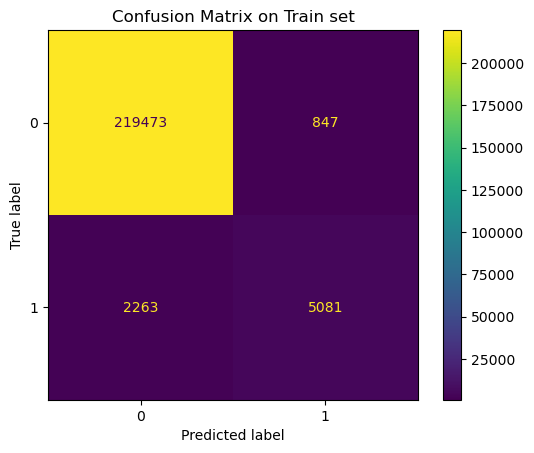

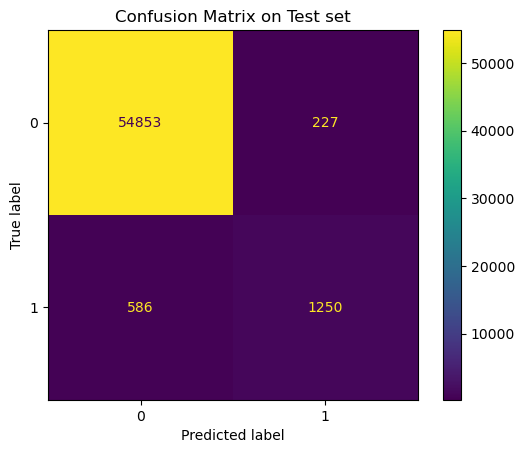

In [21]:
# Visualize confusion matrices
_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="Confusion Matrix on Train set"
)  # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(
    classifier, X_train, Y_train, ax=ax
)  # ConfusionMatrixDisplay from sklearn
plt.show()

_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="Confusion Matrix on Test set"
)  # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(
    classifier, X_test, Y_test, ax=ax
)  # ConfusionMatrixDisplay from sklearn
plt.show()

In [22]:
# You can also check more performance metrics to better understand what your model is doing
print("Confusion matrix on train set : ")
print(confusion_matrix(Y_train, Y_train_pred))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(Y_test, Y_test_pred))
print()

Confusion matrix on train set : 
[[219473    847]
 [  2263   5081]]

Confusion matrix on test set : 
[[54853   227]
 [  586  1250]]



In [23]:
classifier.coef_

array([[-0.59441527, -0.7877923 ,  2.54407066,  3.57048233,  3.41344856,
         3.04767829, -0.19522314, -0.04932829]])

In [24]:
column_names = []
for name, pipeline, features_list in preprocessor.transformers_: # loop over pipelines
    if name == 'num': # if pipeline is for numeric variables
        features = features_list # just get the names of columns to which it has been applied
    else: # if pipeline is for categorical variables
        features = pipeline.named_steps['encoder'].get_feature_names_out() # get output columns names from OneHotEncoder
    column_names.extend(features) # concatenate features names
        
print("Names of columns corresponding to each coefficient: ", column_names)

Names of columns corresponding to each coefficient:  ['age', 'new_user', 'total_pages_visited', 'country_Germany', 'country_UK', 'country_US', 'source_Direct', 'source_Seo']


In [25]:
# Create a pandas DataFrame
coefs = pd.DataFrame(index = column_names, data = classifier.coef_.transpose(), columns=["coefficients"])
coefs

,coefficients
age,-0.594415
new_user,-0.787792
total_pages_visited,2.544071
country_Germany,3.570482
country_UK,3.413449
country_US,3.047678
source_Direct,-0.195223
source_Seo,-0.049328


In [26]:
# Compute abs() and sort values
feature_importance = abs(coefs).sort_values(by = 'coefficients')
feature_importance

,coefficients
source_Seo,0.049328
source_Direct,0.195223
age,0.594415
new_user,0.787792
total_pages_visited,2.544071
country_US,3.047678
country_UK,3.413449
country_Germany,3.570482


In [27]:
# Plot coefficients sorted from highest to lowest
fig = px.bar(feature_importance.sort_values(by = 'coefficients', ascending=False), orientation='v')
fig.update_layout(showlegend=True, 
                 margin={'l': 120}  # to avoid cropping of column names
                )
fig.show()

In [28]:
coefs['category'] = coefs.index.str.rsplit('_', n=1).str[0]

In [29]:
coefs

,coefficients,category
age,-0.594415,age
new_user,-0.787792,new
total_pages_visited,2.544071,total_pages
country_Germany,3.570482,country
country_UK,3.413449,country
country_US,3.047678,country
source_Direct,-0.195223,source
source_Seo,-0.049328,source


In [30]:
grouped_coefs = coefs.groupby('category').sum()

In [31]:
# Plot coefficients sorted from highest to lowest
fig = px.bar(grouped_coefs.sort_values(by = 'coefficients', ascending=False), orientation='v')
fig.update_layout(showlegend=True, 
                 margin={'l': 120}  # to avoid cropping of column names
                )
fig.show()

### Observations:

- We can see that country and total_pages are columns with the highest coefficient with the target variable.
- We get an F1 score of 0.765 on the training set and 0.754 on the test set, which is our score on our base model.

# PART 2 - Improving F1-Score

## 2.1. Random Forest 

Let's train a Random Forest and compare it with the logistic regression model to evaluate its performance.

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [33]:
# Perform grid search
print("Grid search...")
classifier = RandomForestClassifier()

# Grid of values to be tested
params = {
    "max_depth": [2, 4, 6, 8, 10],
    "min_samples_leaf": [1, 2, 5],
    "min_samples_split": [2, 4, 8],
    "n_estimators": [10, 20, 40, 60, 80, 100],
    "verbose":[1],
}
gridsearch = GridSearchCV(
    classifier, param_grid=params, cv=3
)  # cv : the number of folds to be used for CV
gridsearch.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", gridsearch.best_params_)
print("Best validation accuracy : ", gridsearch.best_score_)

Grid search...


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Do

...Done.
Best hyperparameters :  {'max_depth': 8, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 80, 'verbose': 1}
Best validation accuracy :  0.986190174994729


In [34]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = gridsearch.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

Predictions on training set...


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.8s


...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.7s


...Done.
[[0.99878526 0.00121474]
 [0.99743092 0.00256908]
 [0.99840638 0.00159362]
 ...
 [0.98863288 0.01136712]
 [0.94214113 0.05785887]
 [0.99707366 0.00292634]]



In [35]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = gridsearch.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = gridsearch.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()

Predictions on test set...


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s


...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[0.99684523 0.00315477]
 [0.98791944 0.01208056]
 [0.99832779 0.00167221]
 ...
 [0.98673953 0.01326047]
 [0.99556684 0.00443316]
 [0.99646448 0.00353552]]



[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s


In [36]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

accuracy on training set :  0.9867260524281397
accuracy on test set :  0.9852238386393984

f1-score on training set :  0.7706435944140863
f1-score on test set :  0.7449196239005156



[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.9s


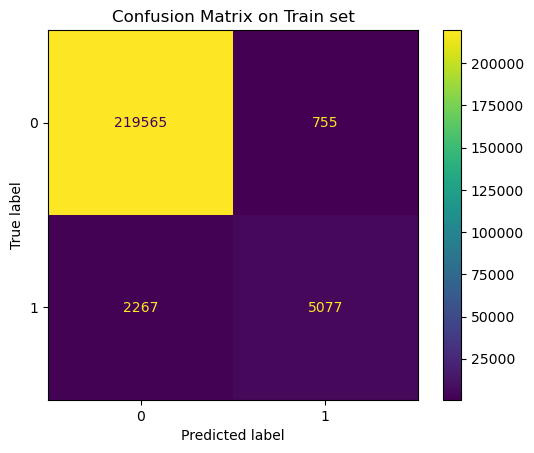

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.3s


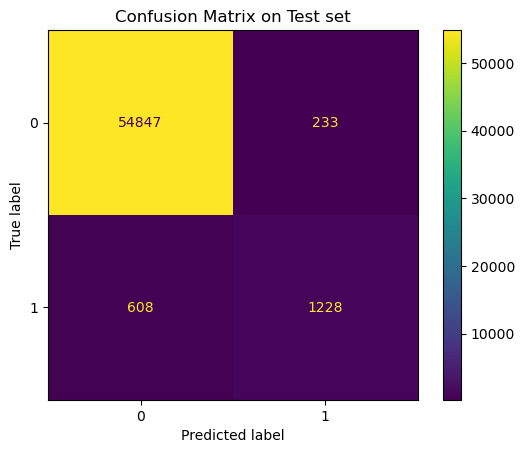

In [37]:
# Visualize confusion matrices
_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="Confusion Matrix on Train set"
)  # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(
    gridsearch, X_train, Y_train, ax=ax
)  # ConfusionMatrixDisplay from sklearn
plt.show()

_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="Confusion Matrix on Test set"
)  # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(
    gridsearch, X_test, Y_test, ax=ax
)  # ConfusionMatrixDisplay from sklearn
plt.show()

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.0s


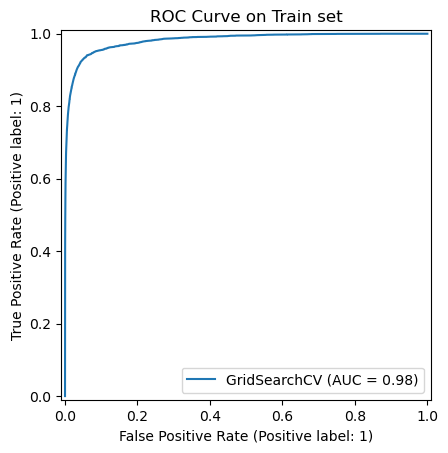

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s


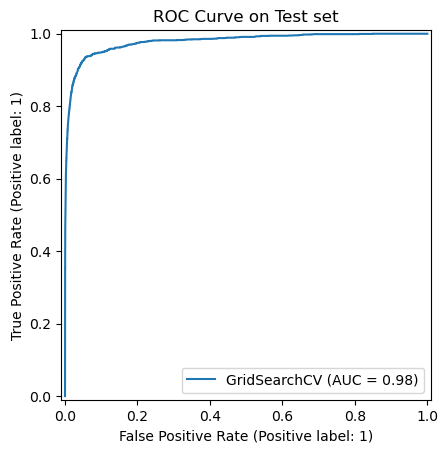

In [38]:
# Visualize ROC curves
_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="ROC Curve on Train set"
)  # Set a title that we will add into ConfusionMatrixDisplay
RocCurveDisplay.from_estimator(
    gridsearch, X_train, Y_train, ax=ax
)  # RocCurveDisplay from sklearn
plt.show()

_, ax = plt.subplots()  # Get subplot from matplotlib
ax.set(
    title="ROC Curve on Test set"
)  # Set a title that we will add into ConfusionMatrixDisplay
RocCurveDisplay.from_estimator(
    gridsearch, X_test, Y_test, ax=ax
)  # RocCurveDisplay from sklearn
plt.show()

## 2.2 Gradient Boosting 

In [39]:
from sklearn.ensemble import GradientBoostingClassifier

In [40]:
# Perform grid search
print("Grid search...")
model = GradientBoostingClassifier()

# Grid of values to be tested
params = {
    "max_depth": [
        1,
        2,
        3,
    ],  # no base_estimator_ prefix because these are all arguments of GradientBoostingClassifier
    "min_samples_leaf": [1, 2, 3],
    "min_samples_split": [2, 3, 4],
    "n_estimators": [2, 4, 6, 8, 10],
}
print(params)
gridsearch = GridSearchCV(
    model, param_grid=params, cv=3
)  # cv : the number of folds to be used for CV
gridsearch.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", gridsearch.best_params_)
print("Best validation accuracy : ", gridsearch.best_score_)
print()
print("Accuracy on training set : ", gridsearch.score(X_train, Y_train))
print("Accuracy on test set : ", gridsearch.score(X_test, Y_test))


Grid search...
{'max_depth': [1, 2, 3], 'min_samples_leaf': [1, 2, 3], 'min_samples_split': [2, 3, 4], 'n_estimators': [2, 4, 6, 8, 10]}
...Done.
Best hyperparameters :  {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}
Best validation accuracy :  0.9842487174081102

Accuracy on training set :  0.9847406704617331
Accuracy on test set :  0.984292641787898


In [41]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = gridsearch.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...
...Done.
[[0.9873492  0.0126508 ]
 [0.9873492  0.0126508 ]
 [0.9873492  0.0126508 ]
 ...
 [0.9873492  0.0126508 ]
 [0.95936786 0.04063214]
 [0.98056392 0.01943608]]



In [42]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = gridsearch.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = gridsearch.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[0.9873492  0.0126508 ]
 [0.9873492  0.0126508 ]
 [0.9873492  0.0126508 ]
 ...
 [0.9873492  0.0126508 ]
 [0.98685246 0.01314754]
 [0.9873492  0.0126508 ]]



In [43]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

accuracy on training set :  0.9847406704617331
accuracy on test set :  0.984292641787898

f1-score on training set :  0.7219020172910663
f1-score on test set :  0.7129094412331407



### let's optimize the Gradient Boosting Classifier with optuna and find the best hyperparameters

In [44]:
import optuna

In [45]:
def objective(trial):
    params = {"n_estimators": trial.suggest_int("n_estimators", 50, 500, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5)}
    
    model = GradientBoostingClassifier(**params)
    model.fit(X_train, Y_train)

    Y_pred = model.predict(X_test)

    f1 = f1_score(Y_test, Y_pred)
    return f1

In [46]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

[I 2025-02-23 15:09:02,149] A new study created in memory with name: no-name-f3e47255-3204-4bc3-bae3-288e2703c330
[I 2025-02-23 15:09:18,944] Trial 0 finished with value: 0.6829752066115703 and parameters: {'n_estimators': 150, 'learning_rate': 0.01576777405280833, 'max_depth': 2, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.6829752066115703.
[I 2025-02-23 15:09:44,417] Trial 1 finished with value: 0.7337205747477835 and parameters: {'n_estimators': 200, 'learning_rate': 0.02883464216134823, 'max_depth': 2, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.7337205747477835.
[I 2025-02-23 15:11:57,417] Trial 2 finished with value: 0.7458133971291866 and parameters: {'n_estimators': 350, 'learning_rate': 0.029016575003358146, 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.7458133971291866.
[I 2025-02-23 15:13:02,590] Trial 3 finished with value: 0.7481236865806065 and parameters:

In [50]:
print("best hyperparameters :", study.best_params)
print("best F1-score :", study.best_value)

best hyperparameters : {'n_estimators': 300, 'learning_rate': 0.1157235199533514, 'max_depth': 2, 'min_samples_split': 6, 'min_samples_leaf': 3}
best F1-score : 0.7544122046066407


In [48]:
best_params = study.best_params
best_model = GradientBoostingClassifier(**best_params, random_state=42)
best_model.fit(X_train, Y_train)

GradientBoostingClassifier(learning_rate=0.1157235199533514, max_depth=2,
                           min_samples_leaf=3, min_samples_split=6,
                           n_estimators=300, random_state=42)

In [49]:
Y_pred = best_model.predict(X_test)
Y_prob = best_model.predict_proba(X_test)[:, 1]
print("F1-score final:", f1_score(Y_test, Y_pred))


F1-score final: 0.7544122046066407


In [51]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = best_model.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = best_model.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...
...Done.
[[9.99960625e-01 3.93748653e-05]
 [9.99054838e-01 9.45161986e-04]
 [9.99823481e-01 1.76518574e-04]
 ...
 [9.99098947e-01 9.01052531e-04]
 [8.81182052e-01 1.18817948e-01]
 [9.93673458e-01 6.32654239e-03]]



In [54]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = best_model.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = best_model.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[9.99743855e-01 2.56144853e-04]
 [9.97016163e-01 2.98383722e-03]
 [9.99755408e-01 2.44591526e-04]
 ...
 [9.99141673e-01 8.58327414e-04]
 [9.98000863e-01 1.99913693e-03]
 [9.99484721e-01 5.15278974e-04]]



In [55]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

accuracy on training set :  0.9864361515215405
accuracy on test set :  0.9855752336777005

f1-score on training set :  0.7690005984440454
f1-score on test set :  0.7544122046066407



# PART 3 - Submission

- We can observe that the Optuna framework has successfully optimized the gradient boosting model because it now has a higher F1-score than the Random Forest Model.
- However, the most efficient model remains the logistic regression model.

1. Regression logistic : F1 score = **0.7546**
2. Random Forest : F1 score = **0.7449**
3. Gradient Boosting : F1 score = **0.7129**
4. Gradient Boosting with Optuna : F1 score = **0.7544**

With an F1-score of 0.7546, after submitting the linear regression model, we finished 7th in the ranking.

![result](result_conversion-rate.png)

# PART 4 - Recommendations

### The hyperparameters with the most impact on the conversion rate for logistic regression are "country" and "total_pages_visited"          
### The recommendations for improvement therefore concern these 2 parameters:
     

### - **Country**: China is the country with the lowest conversion rate, making a campaign targeting this country in particular would be beneficial.
### - **Total_pages_visited**: Encouraging users to explore at least 10 pages can significantly improve conversion rates and placing conversion incentives (buttons, promotions) around the 10th page visited could increase conversions